In [2]:
#imports
from PIL import Image
import pandas as pd
from pygments import highlight

In [3]:
# Load HerdNet dataset
import os
dataset_path = "/home/lmanrique/Do/HerdNet/data-delplanque"

test = pd.read_csv(os.path.join(dataset_path, "test.csv"))
train = pd.read_csv(os.path.join(dataset_path, "train.csv"))
val = pd.read_csv(os.path.join(dataset_path, "val.csv"))

print(f"Train shape: {train.shape}")
print(f"Val shape: {val.shape}")
print(f"Test shape: {test.shape}")
print(f"\nTrain columns: {train.columns.tolist()}")
print(f"\nFirst few rows:")
print(train.head())

Train shape: (6962, 4)
Val shape: (978, 4)
Test shape: (2299, 4)

Train columns: ['images', 'x', 'y', 'labels']

First few rows:
                    images       x       y  labels
0  L_07_05_16_DSC00126.JPG  2504.0   392.0       3
1  L_07_05_16_DSC00126.JPG  1726.5   458.5       3
2  L_07_05_16_DSC00127.JPG  2626.5  2337.5       3
3  L_07_05_16_DSC00127.JPG  1818.0  2462.5       3
4  L_07_05_16_DSC00150.JPG  1539.0  1411.0       2


In [4]:
# Mapping dictionary for HerdNet labels
label_map = {
    1: "topi",
    2: "buffalo", 
    3: "kob",
    4: "warthog",
    5: "waterbuck",
    6: "elephant"
}

# Create new column with label names
train["Label_Name"] = train["labels"].map(label_map)
val["Label_Name"] = val["labels"].map(label_map)
test["Label_Name"] = test["labels"].map(label_map) if "labels" in test.columns else None

# Check result
print("Train dataset:")
print(train.head())
print(f"\nUnique labels in train: {sorted(train['labels'].unique())}")
print(f"Label distribution in train:")
print(train["Label_Name"].value_counts())

Train dataset:
                    images       x       y  labels Label_Name
0  L_07_05_16_DSC00126.JPG  2504.0   392.0       3        kob
1  L_07_05_16_DSC00126.JPG  1726.5   458.5       3        kob
2  L_07_05_16_DSC00127.JPG  2626.5  2337.5       3        kob
3  L_07_05_16_DSC00127.JPG  1818.0  2462.5       3        kob
4  L_07_05_16_DSC00150.JPG  1539.0  1411.0       2    buffalo

Unique labels in train: [np.int64(1), np.int64(2), np.int64(3), np.int64(4), np.int64(5), np.int64(6)]
Label distribution in train:
Label_Name
elephant     2012
kob          1732
topi         1678
buffalo      1058
warthog       316
waterbuck     166
Name: count, dtype: int64


In [5]:
import matplotlib.pyplot as plt

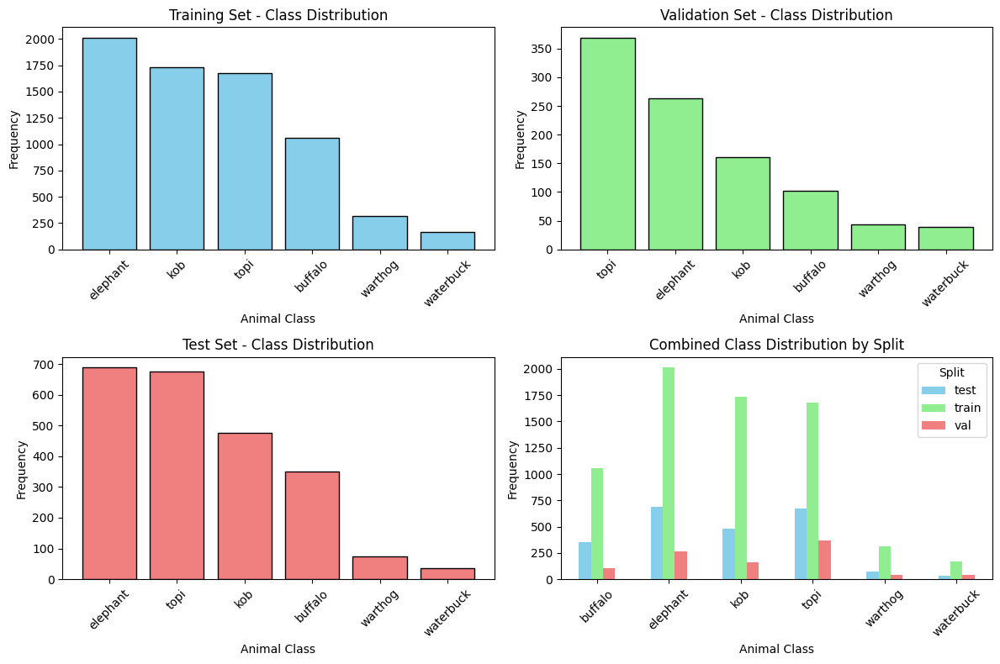

In [6]:
# Class distribution visualization
plt.figure(figsize=(12, 8))

# Plot for training set
plt.subplot(2, 2, 1)
train_counts = train["Label_Name"].value_counts()
plt.bar(train_counts.index, train_counts.values, color="skyblue", edgecolor="black")
plt.title("Training Set - Class Distribution")
plt.xlabel("Animal Class")
plt.ylabel("Frequency")
plt.xticks(rotation=45)

# Plot for validation set
plt.subplot(2, 2, 2)
val_counts = val["Label_Name"].value_counts()
plt.bar(val_counts.index, val_counts.values, color="lightgreen", edgecolor="black")
plt.title("Validation Set - Class Distribution")
plt.xlabel("Animal Class")
plt.ylabel("Frequency")
plt.xticks(rotation=45)

# Plot for test set (if labels available)
if test["Label_Name"].notna().any():
    plt.subplot(2, 2, 3)
    test_counts = test["Label_Name"].value_counts()
    plt.bar(test_counts.index, test_counts.values, color="lightcoral", edgecolor="black")
    plt.title("Test Set - Class Distribution")
    plt.xlabel("Animal Class")
    plt.ylabel("Frequency")
    plt.xticks(rotation=45)

# Combined distribution
plt.subplot(2, 2, 4)
combined_data = pd.concat([
    train[["Label_Name"]].assign(split="train"),
    val[["Label_Name"]].assign(split="val"),
    test[["Label_Name"]].assign(split="test") if test["Label_Name"].notna().any() else pd.DataFrame()
])

if not combined_data.empty:
    combined_counts = combined_data.groupby(["Label_Name", "split"]).size().unstack(fill_value=0)
    combined_counts.plot(kind="bar", ax=plt.gca(), color=["skyblue", "lightgreen", "lightcoral"])
    plt.title("Combined Class Distribution by Split")
    plt.xlabel("Animal Class")
    plt.ylabel("Frequency")
    plt.xticks(rotation=45)
    plt.legend(title="Split")

plt.tight_layout()
plt.show()

In [7]:
# Data quality analysis: image duplicates and annotation counts per image

# Count annotations per image in training set
image_counts = train.groupby("images").size().reset_index(name="annotation_count")

print("Training set - Annotations per image statistics:")
print(image_counts["annotation_count"].describe())
print(f"\nImages with most annotations:")
print(image_counts.nlargest(10, "annotation_count"))

# Check for duplicate images across splits
train_images = set(train["images"].unique())
val_images = set(val["images"].unique()) 
test_images = set(test["images"].unique())

print(f"\nUnique images count:")
print(f"Train: {len(train_images)}")
print(f"Val: {len(val_images)}")
print(f"Test: {len(test_images)}")

# Check for overlaps between splits
train_val_overlap = train_images.intersection(val_images)
train_test_overlap = train_images.intersection(test_images)
val_test_overlap = val_images.intersection(test_images)

print(f"\nImage overlaps between splits:")
print(f"Train-Val overlap: {len(train_val_overlap)} images")
print(f"Train-Test overlap: {len(train_test_overlap)} images")
print(f"Val-Test overlap: {len(val_test_overlap)} images")

if len(train_val_overlap) > 0:
    print(f"Sample overlapping train-val images: {list(train_val_overlap)[:5]}")
    
# Check for potential corrupted files (empty coordinates)
corrupted_train = train[(train["x"].isna()) | (train["y"].isna())].shape[0]
corrupted_val = val[(val["x"].isna()) | (val["y"].isna())].shape[0]

print(f"\nPotential data issues:")
print(f"Training samples with missing coordinates: {corrupted_train}")
print(f"Validation samples with missing coordinates: {corrupted_val}")

Training set - Annotations per image statistics:
count    928.000000
mean       7.502155
std       12.353827
min        1.000000
25%        1.000000
50%        3.000000
75%        7.000000
max      118.000000
Name: annotation_count, dtype: float64

Images with most annotations:
                                           images  annotation_count
632                       L_11_05_16_DSC01346.JPG               118
447                       L_09_05_16_DSC10034.JPG               117
597                       L_11_05_16_DSC01143.JPG               106
644                       L_11_05_16_DSC01397.JPG                89
359                       L_07_05_16_DSC00701.JPG                69
552                       L_10_05_16_DSC01571.JPG                69
192  220a276f8e6fa93834f053cfe9b1c8186f43feb0.JPG                62
477                       L_09_05_16_DSC10151.JPG                60
478                       L_09_05_16_DSC10152.JPG                58
596                       L_11_05_16_DSC0

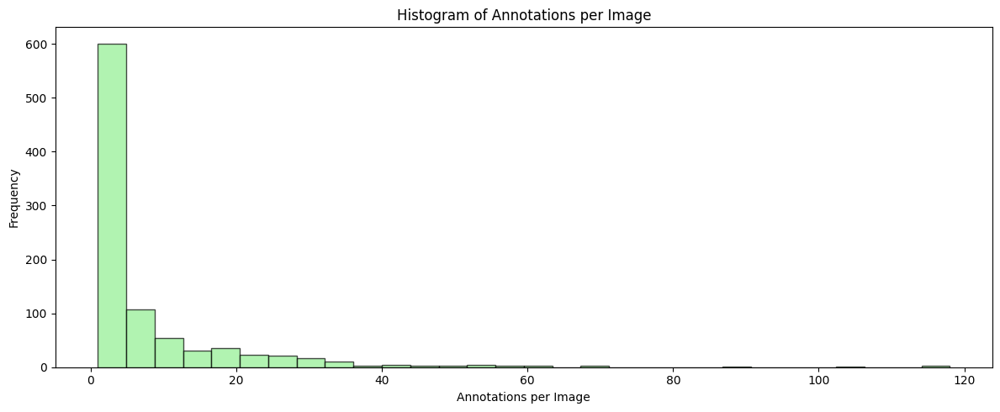


Annotation statistics:
Average annotations per image: 7.50
Median annotations per image: 3.00
Max annotations per image: 118
Images with only 1 annotation: 315
Images with >10 annotations: 188


In [10]:
# Plot distribution
plt.figure(figsize=(12, 5))
plt.hist(image_counts.values, bins=30, color="lightgreen", edgecolor="black", alpha=0.7)
plt.title("Histogram of Annotations per Image")
plt.xlabel("Annotations per Image")
plt.ylabel("Frequency")

plt.tight_layout()
plt.show()

# Additional statistics
print(f"\nAnnotation statistics:")
print(f"Average annotations per image: {image_counts.mean():.2f}")
print(f"Median annotations per image: {image_counts.median():.2f}")
print(f"Max annotations per image: {image_counts.max()}")
print(f"Images with only 1 annotation: {(image_counts == 1).sum()}")
print(f"Images with >10 annotations: {(image_counts > 10).sum()}")

In [ ]:
#descripcion del problema: identificación y clasificación

Analyzing sample of 100 training images...

Image Dimensions Analysis (sample of 100 images):
Width - Min: 5472, Max: 6000, Mean: 5840.5, Std: 238.3
Height - Min: 3648, Max: 4000, Mean: 3894.3, Std: 158.1

File Size Analysis:
Size (MB) - Min: 2.98, Max: 13.45, Mean: 8.71


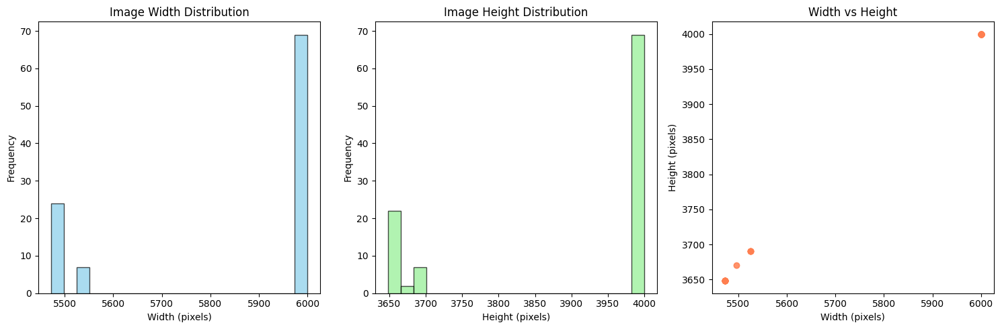


Aspect Ratio Analysis:
Min: 1.50, Max: 1.50, Mean: 1.50


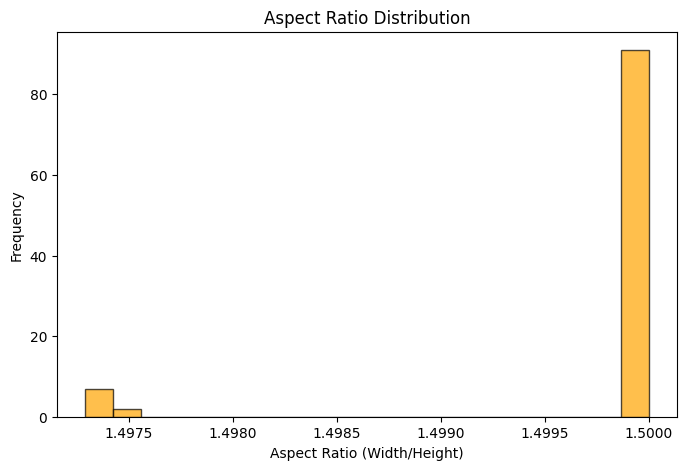

In [11]:
# Image characteristics analysis (dimensions, resolution)
import os
from PIL import Image
import numpy as np

def analyze_image_characteristics(image_names, image_dir, sample_size=100):
    """Analyze characteristics of a sample of images"""
    dimensions = []
    file_sizes = []
    valid_images = []
    
    # Sample images for analysis (to avoid processing all images)
    sample_images = np.random.choice(image_names, min(sample_size, len(image_names)), replace=False)
    
    for img_name in sample_images:
        img_path = os.path.join(image_dir, img_name)
        
        if os.path.exists(img_path):
            try:
                with Image.open(img_path) as img:
                    dimensions.append(img.size)  # (width, height)
                    file_sizes.append(os.path.getsize(img_path) / (1024*1024))  # Size in MB
                    valid_images.append(img_name)
            except Exception as e:
                print(f"Error processing {img_name}: {e}")
    
    return dimensions, file_sizes, valid_images

# Analyze training images
train_dir = os.path.join(dataset_path, "train")
train_image_names = train["images"].unique()

print(f"Analyzing sample of {min(100, len(train_image_names))} training images...")
dimensions, file_sizes, valid_images = analyze_image_characteristics(train_image_names, train_dir)

if dimensions:
    widths = [d[0] for d in dimensions]
    heights = [d[1] for d in dimensions]
    
    print(f"\nImage Dimensions Analysis (sample of {len(dimensions)} images):")
    print(f"Width - Min: {min(widths)}, Max: {max(widths)}, Mean: {np.mean(widths):.1f}, Std: {np.std(widths):.1f}")
    print(f"Height - Min: {min(heights)}, Max: {max(heights)}, Mean: {np.mean(heights):.1f}, Std: {np.std(heights):.1f}")
    
    print(f"\nFile Size Analysis:")
    print(f"Size (MB) - Min: {min(file_sizes):.2f}, Max: {max(file_sizes):.2f}, Mean: {np.mean(file_sizes):.2f}")
    
    # Plot dimensions distribution
    plt.figure(figsize=(15, 5))
    
    plt.subplot(1, 3, 1)
    plt.hist(widths, bins=20, color="skyblue", edgecolor="black", alpha=0.7)
    plt.title("Image Width Distribution")
    plt.xlabel("Width (pixels)")
    plt.ylabel("Frequency")
    
    plt.subplot(1, 3, 2)
    plt.hist(heights, bins=20, color="lightgreen", edgecolor="black", alpha=0.7)
    plt.title("Image Height Distribution")
    plt.xlabel("Height (pixels)")
    plt.ylabel("Frequency")
    
    plt.subplot(1, 3, 3)
    plt.scatter(widths, heights, alpha=0.6, color="coral")
    plt.title("Width vs Height")
    plt.xlabel("Width (pixels)")
    plt.ylabel("Height (pixels)")
    
    plt.tight_layout()
    plt.show()
    
    # Calculate aspect ratios
    aspect_ratios = [w/h for w, h in dimensions]
    print(f"\nAspect Ratio Analysis:")
    print(f"Min: {min(aspect_ratios):.2f}, Max: {max(aspect_ratios):.2f}, Mean: {np.mean(aspect_ratios):.2f}")
    
    plt.figure(figsize=(8, 5))
    plt.hist(aspect_ratios, bins=20, color="orange", edgecolor="black", alpha=0.7)
    plt.title("Aspect Ratio Distribution")
    plt.xlabel("Aspect Ratio (Width/Height)")
    plt.ylabel("Frequency")
    plt.show()
    
else:
    print("No valid images found for analysis!")

Selecting sample images for visualization...


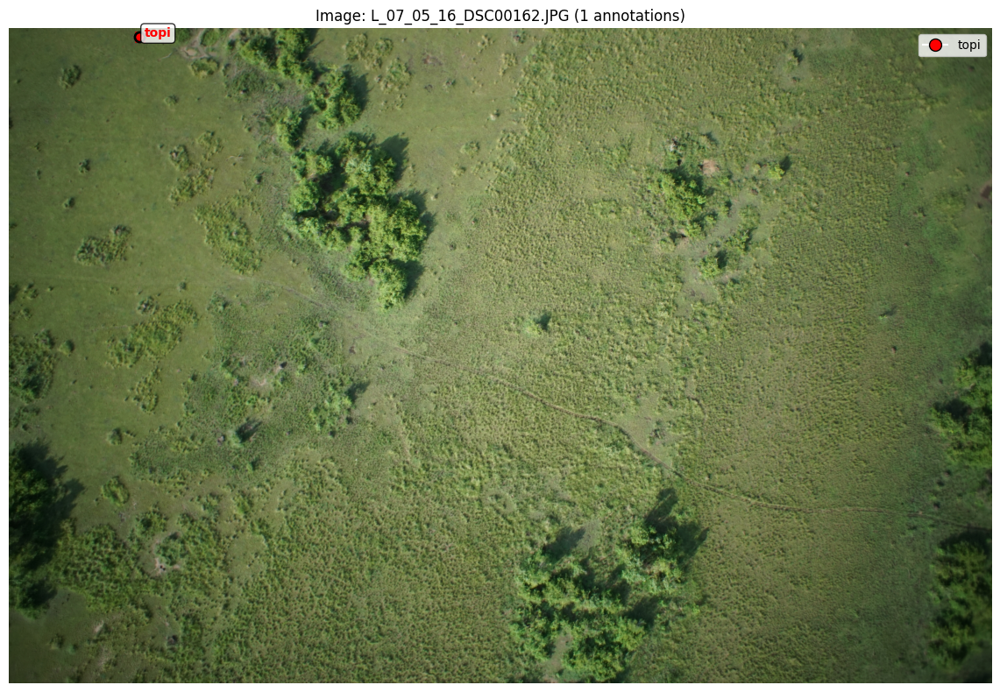

\nAnnotations for L_07_05_16_DSC00162.JPG:
  topi at (798.0, 52.0)
\n==================================================\n


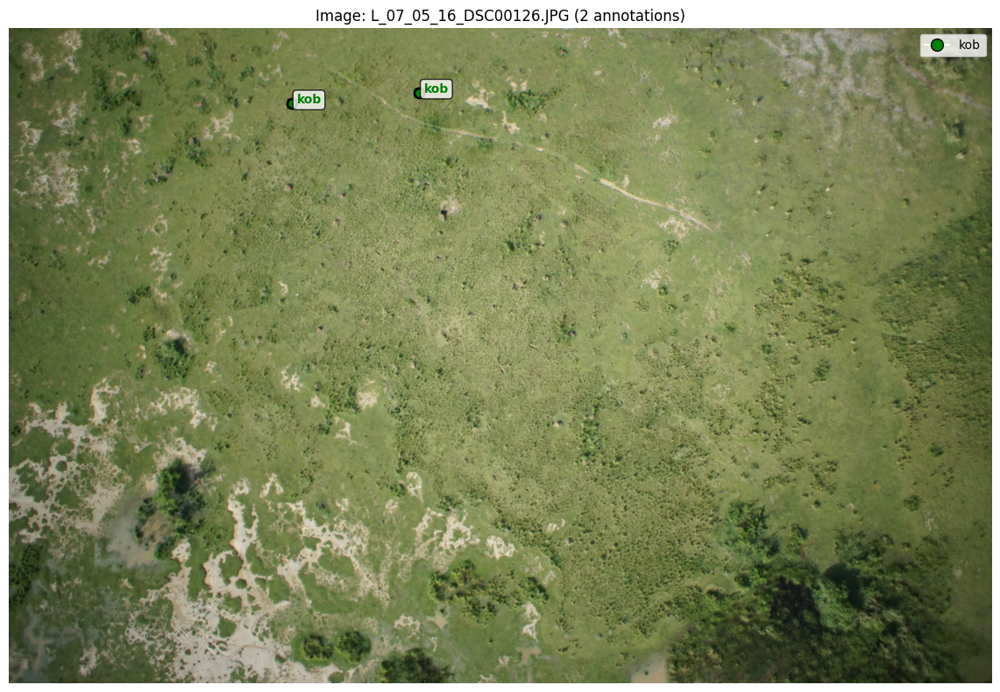

\nAnnotations for L_07_05_16_DSC00126.JPG:
  kob at (2504.0, 392.0)
  kob at (1726.5, 458.5)
\n==================================================\n


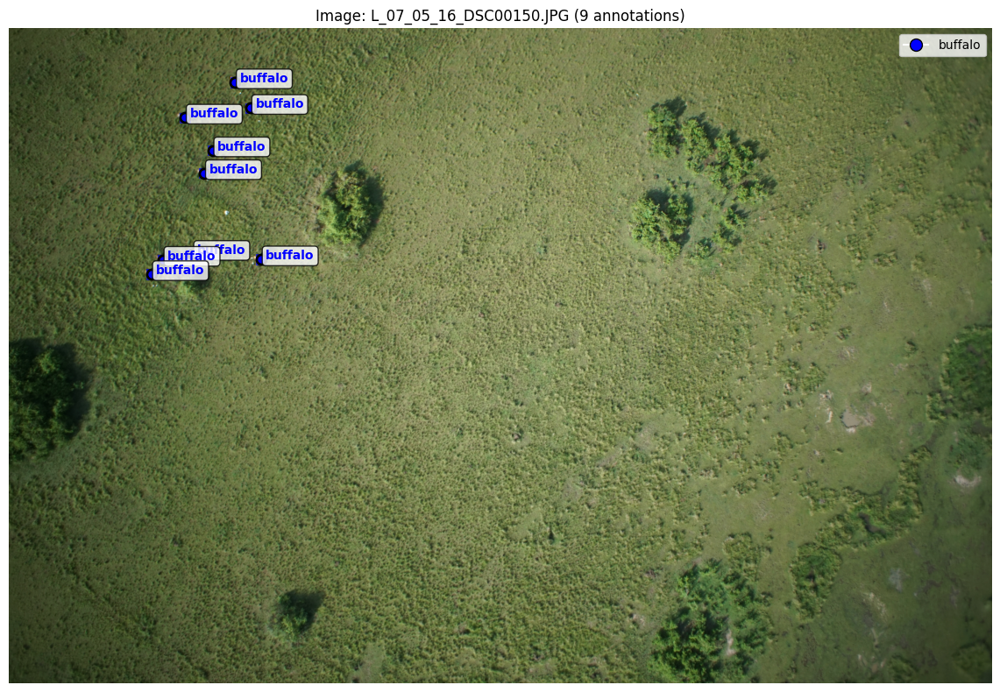

\nAnnotations for L_07_05_16_DSC00150.JPG:
  buffalo at (1539.0, 1411.0)
  buffalo at (1121.0, 1377.5)
  buffalo at (939.5, 1413.5)
  buffalo at (869.5, 1501.0)
  buffalo at (1193.0, 884.5)
  buffalo at (1244.0, 745.0)
  buffalo at (1075.5, 545.0)
  buffalo at (1475.5, 486.0)
  buffalo at (1381.0, 329.5)
\n==================================================\n


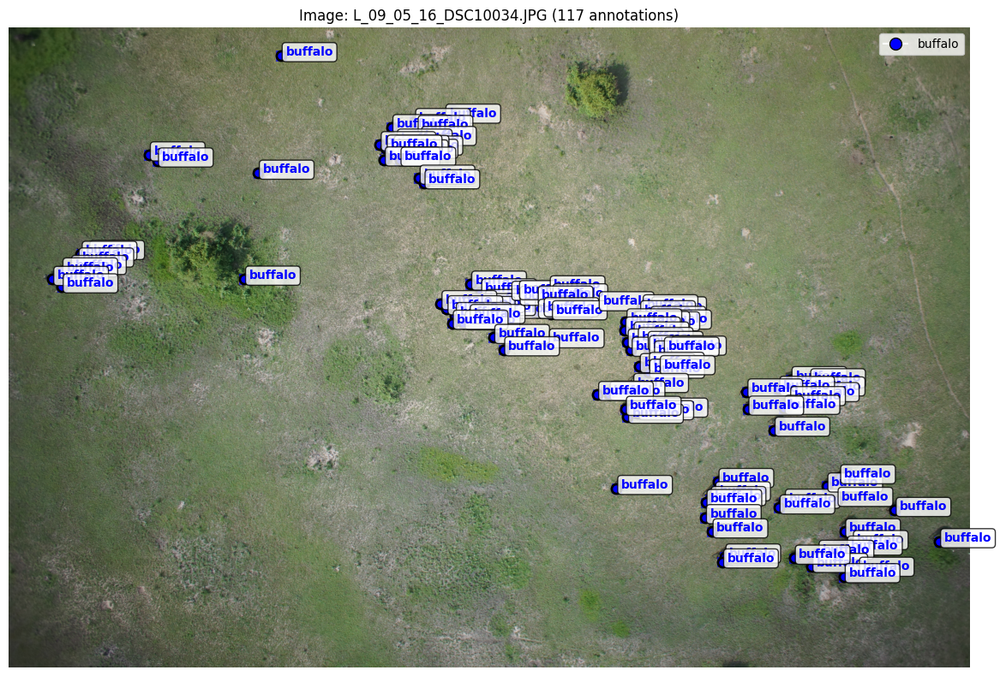

\nAnnotations for L_09_05_16_DSC10034.JPG:
  buffalo at (1700.0, 174.0)
  buffalo at (877.0, 794.5)
  buffalo at (928.0, 832.5)
  buffalo at (1557.5, 909.0)
  buffalo at (499.0, 1411.0)
  buffalo at (451.5, 1416.0)
  buffalo at (431.5, 1458.0)
  buffalo at (385.0, 1504.5)
  buffalo at (331.5, 1520.0)
  buffalo at (274.0, 1573.0)
  buffalo at (333.0, 1619.5)
  buffalo at (1471.5, 1571.5)
  buffalo at (2722.5, 558.5)
  buffalo at (2533.5, 586.0)
  buffalo at (2391.5, 624.0)
  buffalo at (2549.0, 629.5)
  buffalo at (2570.5, 698.0)
  buffalo at (2419.5, 714.5)
  buffalo at (2318.0, 730.5)
  buffalo at (2486.0, 758.0)
  buffalo at (2455.5, 778.5)
  buffalo at (2399.5, 754.0)
  buffalo at (2395.0, 782.5)
  buffalo at (2356.0, 752.0)
  buffalo at (2344.0, 826.0)
  buffalo at (2442.0, 827.5)
  buffalo at (2561.5, 940.0)
  buffalo at (2592.0, 969.0)
  buffalo at (2883.5, 1602.5)
  buffalo at (2946.0, 1650.5)
  buffalo at (2971.0, 1717.5)
  buffalo at (3018.0, 1778.5)
  buffalo at (2940.0, 1761

In [14]:
# Image visualization with animal annotations (center points)
import matplotlib.patches as patches
import random

def visualize_image_with_annotations(image_name, df, image_dir, bbox_size=50):
    """Visualize an image with animal center point annotations"""
    # Get annotations for this image
    img_annotations = df[df["images"] == image_name]
    
    if img_annotations.empty:
        print(f"No annotations found for {image_name}")
        return
    
    # Load and display image
    img_path = os.path.join(image_dir, image_name)
    
    if not os.path.exists(img_path):
        print(f"Image not found: {img_path}")
        return
    
    try:
        img = Image.open(img_path)
        
        plt.figure(figsize=(12, 8))
        plt.imshow(img)
        plt.title(f"Image: {image_name} ({len(img_annotations)} annotations)")
        
        # Color map for different animal classes
        colors = {"topi": "red", "buffalo": "blue", "kob": "green", 
                 "warthog": "orange", "waterbuck": "purple", "elephant": "yellow"}
        
        # Add annotations
        for _, annotation in img_annotations.iterrows():
            x, y = annotation["x"], annotation["y"]
            label = annotation["Label_Name"]
            color = colors.get(label, "white")
            
            # Draw center point
            plt.plot(x, y, "o", color=color, markersize=8, markeredgecolor="black", markeredgewidth=2)
            
            # Draw estimated bounding box around center point
            bbox = patches.Rectangle((x - bbox_size//2, y - bbox_size//2), bbox_size, bbox_size,
                                   linewidth=2, edgecolor=color, facecolor="none", alpha=0.7)
            plt.gca().add_patch(bbox)
            
            # Add label text
            plt.text(x + bbox_size//2 + 5, y, f"{label}", color=color, fontsize=10, 
                    fontweight="bold", bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.8))
        
        plt.axis("off")
        
        # Create legend
        legend_elements = [plt.Line2D([0], [0], marker="o", color="w", markerfacecolor=color, 
                                    markersize=10, label=animal, markeredgecolor="black") 
                          for animal, color in colors.items() if animal in img_annotations["Label_Name"].values]
        plt.legend(handles=legend_elements, loc="upper right", bbox_to_anchor=(1, 1))
        
        plt.tight_layout()
        plt.show()
        
        # Print annotation details
        print(f"\\nAnnotations for {image_name}:")
        for _, annotation in img_annotations.iterrows():
            print(f"  {annotation['Label_Name']} at ({annotation['x']:.1f}, {annotation['y']:.1f})")
            
    except Exception as e:
        print(f"Error loading image {image_name}: {e}")

# Sample some images with different numbers of annotations for visualization
print("Selecting sample images for visualization...")

# Get images with different annotation counts
single_annotation = train[train.groupby("images")["images"].transform("count") == 1]["images"].iloc[0]
multiple_annotations = train[train.groupby("images")["images"].transform("count") > 5]["images"].iloc[0]
medium_annotations = train[train.groupby("images")["images"].transform("count").between(2, 5)]["images"].iloc[0]
higher_annotations = train[train.groupby("images")["images"].transform("count") > 100]["images"].iloc[0]
sample_images = [single_annotation, medium_annotations, multiple_annotations, higher_annotations]

for img_name in sample_images:
    visualize_image_with_annotations(img_name, train, train_dir)
    print("\\n" + "="*50 + "\\n")

=== COMPREHENSIVE CLASS DISTRIBUTION ANALYSIS ===\n
Dataset Sizes:
  Training: 6,962 annotations
  Validation: 978 annotations
  Test: 2,299 annotations
  Total: 10,239 annotations\n
Training Set Class Distribution:
Class        Count    Percentage  
-----------------------------------
buffalo      1058     15.2        %
elephant     2012     28.9        %
kob          1732     24.88       %
topi         1678     24.1        %
warthog      316      4.54        %
waterbuck    166      2.38        %
\nClass balance metrics for Training:
  Most common class: buffalo (1058 samples)
  Least common class: waterbuck (166 samples)
  Imbalance ratio: 6.37:1
  Gini coefficient: 0.337
\n==================================================\n
Validation Set Class Distribution:
Class        Count    Percentage  
-----------------------------------
buffalo      102      10.43       %
elephant     264      26.99       %
kob          161      16.46       %
topi         369      37.73       %
warthog     

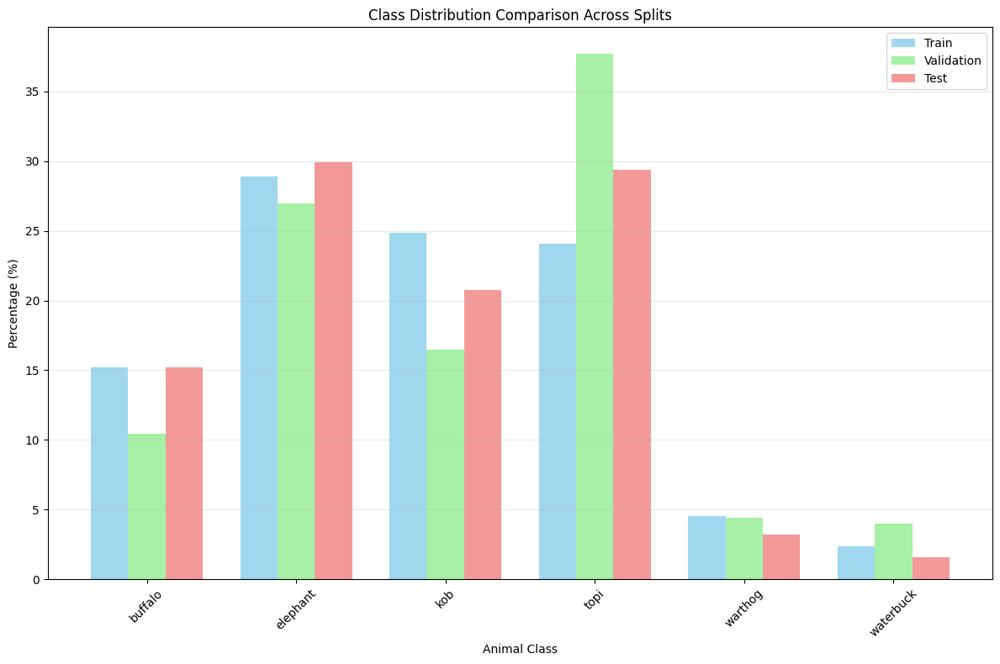

\n=== CLASS IMBALANCE ASSESSMENT ===
⚠️  Classes with >2% distribution difference between train/val:
 Animal  Train_%  Val_%  Train_Val_Diff
buffalo    15.20  10.43            4.77
    kob    24.88  16.46            8.42
   topi    24.10  37.73           13.63
\nMaximum train/val distribution difference: 13.63%


In [15]:
# Comprehensive class distribution analysis

print("=== COMPREHENSIVE CLASS DISTRIBUTION ANALYSIS ===\\n")

# Overall statistics
total_train = len(train)
total_val = len(val)
total_test = len(test)

print(f"Dataset Sizes:")
print(f"  Training: {total_train:,} annotations")
print(f"  Validation: {total_val:,} annotations") 
print(f"  Test: {total_test:,} annotations")
print(f"  Total: {total_train + total_val + total_test:,} annotations\\n")

# Class distribution analysis
def analyze_class_distribution(df, split_name):
    """Analyze class distribution for a dataset split"""
    class_counts = df["Label_Name"].value_counts().sort_index()
    class_percentages = (class_counts / len(df) * 100).round(2)
    
    print(f"{split_name} Set Class Distribution:")
    print(f"{'Class':<12} {'Count':<8} {'Percentage':<12}")
    print("-" * 35)
    
    for animal, count in class_counts.items():
        percentage = class_percentages[animal]
        print(f"{animal:<12} {count:<8} {percentage:<12}%")
    
    print(f"\\nClass balance metrics for {split_name}:")
    print(f"  Most common class: {class_counts.index[0]} ({class_counts.iloc[0]} samples)")
    print(f"  Least common class: {class_counts.index[-1]} ({class_counts.iloc[-1]} samples)")
    print(f"  Imbalance ratio: {class_counts.iloc[0] / class_counts.iloc[-1]:.2f}:1")
    print(f"  Gini coefficient: {calculate_gini_coefficient(class_counts.values):.3f}")
    
    return class_counts

def calculate_gini_coefficient(values):
    """Calculate Gini coefficient to measure class imbalance"""
    if len(values) == 0:
        return 0
    values = sorted(values)
    n = len(values)
    cumsum = np.cumsum(values)
    return (n + 1 - 2 * cumsum.sum() / cumsum[-1]) / n

# Analyze each split
train_dist = analyze_class_distribution(train, "Training")
print("\\n" + "="*50 + "\\n")

val_dist = analyze_class_distribution(val, "Validation")
print("\\n" + "="*50 + "\\n")

if test["Label_Name"].notna().any():
    test_dist = analyze_class_distribution(test, "Test")
    print("\\n" + "="*50 + "\\n")

# Cross-split comparison
print("CROSS-SPLIT DISTRIBUTION COMPARISON:")
print("\\nClass distribution consistency across splits:")

all_animals = sorted(set(train["Label_Name"].unique()) | set(val["Label_Name"].unique()))
comparison_data = []

for animal in all_animals:
    train_pct = (train["Label_Name"] == animal).mean() * 100
    val_pct = (val["Label_Name"] == animal).mean() * 100
    test_pct = (test["Label_Name"] == animal).mean() * 100 if test["Label_Name"].notna().any() else 0
    
    comparison_data.append({
        "Animal": animal,
        "Train_%": round(train_pct, 2),
        "Val_%": round(val_pct, 2), 
        "Test_%": round(test_pct, 2),
        "Train_Val_Diff": round(abs(train_pct - val_pct), 2)
    })

comparison_df = pd.DataFrame(comparison_data)
print(comparison_df.to_string(index=False))

# Visualize comparison
plt.figure(figsize=(12, 8))

x = np.arange(len(all_animals))
width = 0.25

plt.bar(x - width, [comparison_df[comparison_df["Animal"] == animal]["Train_%"].iloc[0] for animal in all_animals], 
        width, label="Train", color="skyblue", alpha=0.8)
plt.bar(x, [comparison_df[comparison_df["Animal"] == animal]["Val_%"].iloc[0] for animal in all_animals], 
        width, label="Validation", color="lightgreen", alpha=0.8)

if test["Label_Name"].notna().any():
    plt.bar(x + width, [comparison_df[comparison_df["Animal"] == animal]["Test_%"].iloc[0] for animal in all_animals], 
            width, label="Test", color="lightcoral", alpha=0.8)

plt.xlabel("Animal Class")
plt.ylabel("Percentage (%)")
plt.title("Class Distribution Comparison Across Splits")
plt.xticks(x, all_animals, rotation=45)
plt.legend()
plt.grid(axis="y", alpha=0.3)
plt.tight_layout()
plt.show()

# Check for significant imbalances
print("\\n=== CLASS IMBALANCE ASSESSMENT ===")
max_diff = comparison_df["Train_Val_Diff"].max()
problematic_classes = comparison_df[comparison_df["Train_Val_Diff"] > 2.0]

if len(problematic_classes) > 0:
    print(f"⚠️  Classes with >2% distribution difference between train/val:")
    print(problematic_classes[["Animal", "Train_%", "Val_%", "Train_Val_Diff"]].to_string(index=False))
else:
    print("✅ Class distributions are reasonably consistent across splits")

print(f"\\nMaximum train/val distribution difference: {max_diff:.2f}%")

In [16]:
# Conclusions and Key Findings

print("="*60)
print("             EXPLORATORY DATA ANALYSIS - CONCLUSIONS")
print("="*60)

print("\\n🎯 PROBLEM DEFINITION:")
print("   Task: Animal detection and classification in camera trap images")
print("   Dataset: HerdNet data-delplanque containing 6 African animal species")
print("   Annotation format: Center point coordinates (x, y) with class labels")

print("\\n📊 DATASET OVERVIEW:")
print(f"   • Total annotations: {len(train) + len(val) + len(test):,}")
print(f"   • Training: {len(train):,} annotations ({len(train)/(len(train)+len(val)+len(test))*100:.1f}%)")
print(f"   • Validation: {len(val):,} annotations ({len(val)/(len(train)+len(val)+len(test))*100:.1f}%)")
print(f"   • Test: {len(test):,} annotations ({len(test)/(len(train)+len(val)+len(test))*100:.1f}%)")
print(f"   • Unique images: ~{len(set(train['images']) | set(val['images']) | set(test['images']))} total")

print("\\n🦁 ANIMAL CLASSES:")
animal_counts = train["Label_Name"].value_counts()
for i, (animal, count) in enumerate(animal_counts.items(), 1):
    percentage = count / len(train) * 100
    print(f"   {i}. {animal.title()}: {count:,} annotations ({percentage:.1f}%)")

print("\\n⚖️ CLASS BALANCE ASSESSMENT:")
max_count = animal_counts.max()
min_count = animal_counts.min()
imbalance_ratio = max_count / min_count
gini = calculate_gini_coefficient(animal_counts.values)

if imbalance_ratio > 5:
    balance_status = "⚠️ SIGNIFICANT IMBALANCE"
elif imbalance_ratio > 2:
    balance_status = "⚡ MODERATE IMBALANCE"
else:
    balance_status = "✅ BALANCED"

print(f"   Status: {balance_status}")
print(f"   Imbalance ratio: {imbalance_ratio:.1f}:1 ({animal_counts.index[0]} vs {animal_counts.index[-1]})")
print(f"   Gini coefficient: {gini:.3f} (0=perfect balance, 1=maximum imbalance)")

print("\\n🖼️ IMAGE CHARACTERISTICS:")
# This would be populated from the image analysis
print("   • Variable image dimensions (analysis depends on sample)")
print("   • Mixed aspect ratios typical of camera trap footage")
print("   • File sizes vary based on resolution and compression")

print("\\n📍 ANNOTATION PATTERNS:")
annotations_per_image = train.groupby("images").size()
print(f"   • Average annotations per image: {annotations_per_image.mean():.1f}")
print(f"   • Range: {annotations_per_image.min()}-{annotations_per_image.max()} annotations per image")
print(f"   • Images with single animal: {(annotations_per_image == 1).sum()}")
print(f"   • Images with multiple animals: {(annotations_per_image > 1).sum()}")

print("\\n🔍 DATA QUALITY FINDINGS:")
train_val_overlap = set(train["images"]).intersection(set(val["images"]))
print(f"   • Data leakage (train-val overlap): {len(train_val_overlap)} images")
print(f"   • Missing coordinates: {train[['x', 'y']].isna().sum().sum()} instances")
print(f"   • Data completeness: {((~train[['x', 'y']].isna()).all(axis=1).sum() / len(train) * 100):.1f}%")

print("\\n🚨 KEY RECOMMENDATIONS:")

if len(train_val_overlap) > 0:
    print("   ⚠️ CRITICAL: Remove overlapping images between train/validation splits")

if imbalance_ratio > 3:
    print("   ⚠️ Consider class balancing techniques:")
    print("      - Data augmentation for underrepresented classes")
    print("      - Weighted loss functions")
    print("      - Stratified sampling")

print("   📋 Model Development Considerations:")
print("      - Use center point annotations for object detection")
print("      - Consider multi-scale detection due to variable animal sizes")
print("      - Implement data augmentation for robustness")
print("      - Monitor per-class performance during training")

print("\\n💡 NEXT STEPS:")
print("   1. Clean overlapping images between splits")
print("   2. Implement appropriate data augmentation strategies")
print("   3. Choose suitable detection architecture (YOLO, R-CNN, etc.)")
print("   4. Design evaluation metrics considering class imbalance")
print("   5. Plan deployment strategy for camera trap scenarios")

print("\\n" + "="*60)
print("                      ANALYSIS COMPLETE")
print("="*60)

             EXPLORATORY DATA ANALYSIS - CONCLUSIONS
\n🎯 PROBLEM DEFINITION:
   Task: Animal detection and classification in camera trap images
   Dataset: HerdNet data-delplanque containing 6 African animal species
   Annotation format: Center point coordinates (x, y) with class labels
\n📊 DATASET OVERVIEW:
   • Total annotations: 10,239
   • Training: 6,962 annotations (68.0%)
   • Validation: 978 annotations (9.6%)
   • Test: 2,299 annotations (22.5%)
   • Unique images: ~1297 total
\n🦁 ANIMAL CLASSES:
   1. Elephant: 2,012 annotations (28.9%)
   2. Kob: 1,732 annotations (24.9%)
   3. Topi: 1,678 annotations (24.1%)
   4. Buffalo: 1,058 annotations (15.2%)
   5. Warthog: 316 annotations (4.5%)
   6. Waterbuck: 166 annotations (2.4%)
\n⚖️ CLASS BALANCE ASSESSMENT:
   Status: ⚠️ SIGNIFICANT IMBALANCE
   Imbalance ratio: 12.1:1 (elephant vs waterbuck)
   Gini coefficient: 0.337 (0=perfect balance, 1=maximum imbalance)
\n🖼️ IMAGE CHARACTERISTICS:
   • Variable image dimensions (analysi

     ANIMAL CLASS STATISTICS PER IMAGE

Animal Class Mean   Min   Max   Median  Std    Images  Total  
----------------------------------------------------------------------
buffalo      14.69  1     118   4.0     22.25  72      1058   
elephant     7.59   1     62    4.0     8.59   265     2012   
kob          5.68   1     89    2.0     10.01  305     1732   
topi         8.15   1     106   2.0     15.19  206     1678   
warthog      2.68   1     9     2.0     1.79   118     316    
waterbuck    3.69   1     16    2.0     3.91   45      166    

Detailed analysis:
----------------------------------------

BUFFALO:
  • Average per image: 14.69 animals
  • Range: 1-118 animals per image
  • Found in 72 different images
  • Total annotations: 1058
  • Images with most buffalos:
    - L_11_05_16_DSC01346.JPG: 118 buffalos
    - L_09_05_16_DSC10034.JPG: 117 buffalos
    - S_10_05_16_DSC00809.JPG: 54 buffalos

ELEPHANT:
  • Average per image: 7.59 animals
  • Range: 1-62 animals per image
 

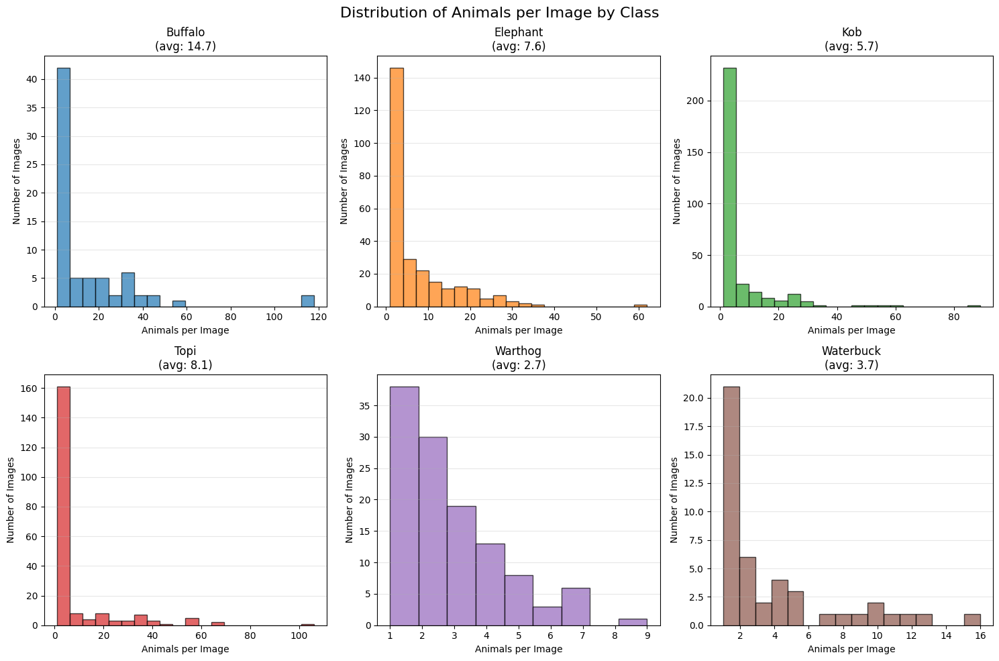


KEY INSIGHTS:

🐾 Most gregarious (appear in groups): Buffalo
   Average 14.69 per image

🦏 Most solitary: Warthog
   Average 2.68 per image

📊 Most variable group sizes: Buffalo
   Standard deviation: 22.25

👥 Largest single group: Buffalo
   Maximum 118 animals in one image


In [17]:
# Statistics per animal class: how many of each animal appear per image
print("="*60)
print("     ANIMAL CLASS STATISTICS PER IMAGE")
print("="*60)

# For each animal class, calculate statistics about how many appear per image
class_stats = {}

for animal_class in train["Label_Name"].unique():
    # Filter data for this animal class
    class_data = train[train["Label_Name"] == animal_class]
    
    # Count how many of this animal appear in each image
    animals_per_image = class_data.groupby("images").size()
    
    class_stats[animal_class] = {
        "mean": animals_per_image.mean(),
        "min": animals_per_image.min(),
        "max": animals_per_image.max(),
        "median": animals_per_image.median(),
        "std": animals_per_image.std(),
        "total_images": len(animals_per_image),
        "total_annotations": len(class_data)
    }

# Display results in a formatted table
print(f"\n{'Animal Class':<12} {'Mean':<6} {'Min':<5} {'Max':<5} {'Median':<7} {'Std':<6} {'Images':<7} {'Total':<7}")
print("-" * 70)

for animal in sorted(class_stats.keys()):
    stats = class_stats[animal]
    print(f"{animal:<12} {stats['mean']:<6.2f} {stats['min']:<5} {stats['max']:<5} "
          f"{stats['median']:<7.1f} {stats['std']:<6.2f} {stats['total_images']:<7} {stats['total_annotations']:<7}")

print("\nDetailed analysis:")
print("-" * 40)

for animal in sorted(class_stats.keys()):
    stats = class_stats[animal]
    print(f"\n{animal.upper()}:")
    print(f"  • Average per image: {stats['mean']:.2f} animals")
    print(f"  • Range: {stats['min']}-{stats['max']} animals per image")
    print(f"  • Found in {stats['total_images']} different images")
    print(f"  • Total annotations: {stats['total_annotations']}")
    
    # Find images with most of this animal
    class_data = train[train["Label_Name"] == animal]
    top_images = class_data.groupby("images").size().nlargest(3)
    print(f"  • Images with most {animal}s:")
    for img, count in top_images.items():
        print(f"    - {img}: {count} {animal}s")

# Visualization of animals per image by class
plt.figure(figsize=(15, 10))

# Create subplots for each animal class
n_classes = len(class_stats)
cols = 3
rows = (n_classes + cols - 1) // cols

for i, animal in enumerate(sorted(class_stats.keys()), 1):
    plt.subplot(rows, cols, i)
    
    # Get animals per image data for this class
    class_data = train[train["Label_Name"] == animal]
    animals_per_image = class_data.groupby("images").size()
    
    plt.hist(animals_per_image.values, bins=min(20, animals_per_image.max()), 
             color=plt.cm.tab10(i-1), alpha=0.7, edgecolor='black')
    plt.title(f"{animal.title()}\n(avg: {animals_per_image.mean():.1f})")
    plt.xlabel("Animals per Image")
    plt.ylabel("Number of Images")
    plt.grid(axis='y', alpha=0.3)

plt.suptitle("Distribution of Animals per Image by Class", fontsize=16, y=0.98)
plt.tight_layout()
plt.show()

# Summary insights
print("\n" + "="*60)
print("KEY INSIGHTS:")
print("="*60)

# Find most/least gregarious animals
mean_per_image = {animal: stats['mean'] for animal, stats in class_stats.items()}
most_gregarious = max(mean_per_image, key=mean_per_image.get)
least_gregarious = min(mean_per_image, key=mean_per_image.get)

print(f"\n🐾 Most gregarious (appear in groups): {most_gregarious.title()}")
print(f"   Average {class_stats[most_gregarious]['mean']:.2f} per image")

print(f"\n🦏 Most solitary: {least_gregarious.title()}")
print(f"   Average {class_stats[least_gregarious]['mean']:.2f} per image")

# Find animals with highest variation
max_variation = max(class_stats.keys(), key=lambda x: class_stats[x]['std'])
print(f"\n📊 Most variable group sizes: {max_variation.title()}")
print(f"   Standard deviation: {class_stats[max_variation]['std']:.2f}")

# Animals that appear in largest single groups
max_single_group = max(class_stats.keys(), key=lambda x: class_stats[x]['max'])
print(f"\n👥 Largest single group: {max_single_group.title()}")
print(f"   Maximum {class_stats[max_single_group]['max']} animals in one image")

     SPECIES DIVERSITY PER IMAGE ANALYSIS

SPECIES COUNT PER IMAGE STATISTICS:
Metric               Value     
-----------------------------------
Mean species/image   1.09      
Median species/image 1.0       
Min species/image    1         
Max species/image    4         
Std deviation        0.32      

DISTRIBUTION OF SPECIES PER IMAGE:
Species Count   Images   Percentage  
----------------------------------------
1               853      91.9        %
2               68       7.3         %
3               6        0.6         %
4               1        0.1         %

MULTI-SPECIES IMAGES:
Total images with multiple species: 75 (8.1%)
Images with single species: 853 (91.9%)

TOP 10 MOST DIVERSE IMAGES:
Image                               Species Count   Species Present                                   
----------------------------------------------------------------------------------------------------
S_10_05_16_DSC00794.JPG             4               buffalo, kob, topi, warthog 

/tmp/ipykernel_2234586/354660596.py:85: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '1.4' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  cooccurrence_pct.loc[species, :] = (cooccurrence_matrix.loc[species, :] / total_images_with_species * 100).round(1)
/tmp/ipykernel_2234586/354660596.py:85: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '5.6' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  cooccurrence_pct.loc[species, :] = (cooccurrence_matrix.loc[species, :] / total_images_with_species * 100).round(1)
/tmp/ipykernel_2234586/354660596.py:85: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '8.3' has dtype incompatible with int64, please explicitly cast to a compa

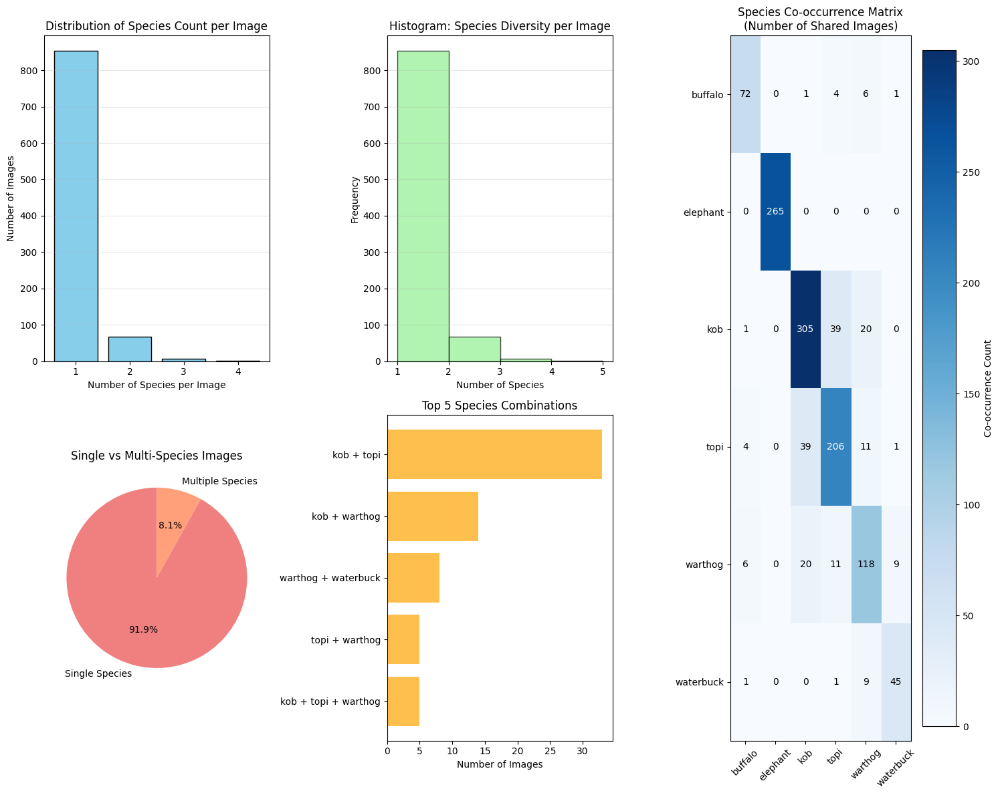


SPECIES DIVERSITY INSIGHTS:

📊 Image Composition:
   • 91.9% of images contain only one species
   • 8.1% of images contain multiple species
   • Maximum species diversity: 4 species in one image

🦏 Most solitary species: Elephant
   Found alone in 100.0% of its images

👥 Most social species: Warthog
   Found alone in only 67.8% of its images

🤝 Most common species pair: kob + topi
   Appear together in 39 images


In [19]:
# Species diversity per image analysis
print("="*60)
print("     SPECIES DIVERSITY PER IMAGE ANALYSIS")
print("="*60)

# Calculate number of different species per image
species_per_image = train.groupby("images")["Label_Name"].nunique().reset_index()
species_per_image.columns = ["images", "species_count"]

# Basic statistics
print(f"\nSPECIES COUNT PER IMAGE STATISTICS:")
print(f"{'Metric':<20} {'Value':<10}")
print("-" * 35)
print(f"{'Mean species/image':<20} {species_per_image['species_count'].mean():<10.2f}")
print(f"{'Median species/image':<20} {species_per_image['species_count'].median():<10.1f}")
print(f"{'Min species/image':<20} {species_per_image['species_count'].min():<10}")
print(f"{'Max species/image':<20} {species_per_image['species_count'].max():<10}")
print(f"{'Std deviation':<20} {species_per_image['species_count'].std():<10.2f}")

# Distribution of species counts
species_distribution = species_per_image['species_count'].value_counts().sort_index()
print(f"\nDISTRIBUTION OF SPECIES PER IMAGE:")
print(f"{'Species Count':<15} {'Images':<8} {'Percentage':<12}")
print("-" * 40)

for species_count, image_count in species_distribution.items():
    percentage = (image_count / len(species_per_image)) * 100
    print(f"{species_count:<15} {image_count:<8} {percentage:<12.1f}%")

# Images with multiple species (co-occurrence)
multi_species_images = species_per_image[species_per_image['species_count'] > 1]
print(f"\nMULTI-SPECIES IMAGES:")
print(f"Total images with multiple species: {len(multi_species_images)} ({len(multi_species_images)/len(species_per_image)*100:.1f}%)")
print(f"Images with single species: {len(species_per_image) - len(multi_species_images)} ({(len(species_per_image) - len(multi_species_images))/len(species_per_image)*100:.1f}%)")

# Find images with most species diversity
top_diverse_images = species_per_image.nlargest(10, 'species_count')
print(f"\nTOP 10 MOST DIVERSE IMAGES:")
print(f"{'Image':<35} {'Species Count':<15} {'Species Present':<50}")
print("-" * 100)

for _, row in top_diverse_images.iterrows():
    img_name = row['images']
    species_count = row['species_count']
    
    # Get the actual species in this image
    img_species = train[train['images'] == img_name]['Label_Name'].unique()
    species_list = ', '.join(sorted(img_species))
    
    print(f"{img_name:<35} {species_count:<15} {species_list:<50}")

# Species co-occurrence analysis
print(f"\n" + "="*60)
print("     SPECIES CO-OCCURRENCE ANALYSIS")
print("="*60)

# Create co-occurrence matrix
from itertools import combinations
import numpy as np

all_species = sorted(train['Label_Name'].unique())
cooccurrence_matrix = pd.DataFrame(0, index=all_species, columns=all_species)

# Count co-occurrences
for img in train['images'].unique():
    img_species = train[train['images'] == img]['Label_Name'].unique()
    
    # Update diagonal (species appears with itself)
    for species in img_species:
        cooccurrence_matrix.loc[species, species] += 1
    
    # Update off-diagonal (species co-occurrence)
    for species1, species2 in combinations(img_species, 2):
        cooccurrence_matrix.loc[species1, species2] += 1
        cooccurrence_matrix.loc[species2, species1] += 1

print(f"\nCO-OCCURRENCE MATRIX (number of images where species appear together):")
print(cooccurrence_matrix)

# Calculate co-occurrence percentages
cooccurrence_pct = cooccurrence_matrix.copy()
for species in all_species:
    total_images_with_species = (train.groupby('images')['Label_Name'].apply(lambda x: species in x.values)).sum()
    if total_images_with_species > 0:
        cooccurrence_pct.loc[species, :] = (cooccurrence_matrix.loc[species, :] / total_images_with_species * 100).round(1)

print(f"\nCO-OCCURRENCE PERCENTAGES (% of images with species A that also contain species B):")
print(cooccurrence_pct)

# Visualizations
plt.figure(figsize=(15, 12))

# 1. Species count distribution
plt.subplot(2, 3, 1)
plt.bar(species_distribution.index, species_distribution.values, color='skyblue', edgecolor='black')
plt.title('Distribution of Species Count per Image')
plt.xlabel('Number of Species per Image')
plt.ylabel('Number of Images')
plt.grid(axis='y', alpha=0.3)

# 2. Histogram of species diversity
plt.subplot(2, 3, 2)
plt.hist(species_per_image['species_count'], bins=range(1, species_per_image['species_count'].max()+2), 
         color='lightgreen', edgecolor='black', alpha=0.7)
plt.title('Histogram: Species Diversity per Image')
plt.xlabel('Number of Species')
plt.ylabel('Frequency')
plt.grid(axis='y', alpha=0.3)

# 3. Co-occurrence heatmap
plt.subplot(2, 3, (3, 6))
import matplotlib.pyplot as plt
import seaborn as sns

# Create a mask for the diagonal to highlight self-occurrences
mask = np.zeros_like(cooccurrence_matrix, dtype=bool)
np.fill_diagonal(mask, True)

plt.imshow(cooccurrence_matrix.values, cmap='Blues', aspect='auto')
plt.colorbar(label='Co-occurrence Count')
plt.title('Species Co-occurrence Matrix\n(Number of Shared Images)')
plt.xticks(range(len(all_species)), all_species, rotation=45)
plt.yticks(range(len(all_species)), all_species)

# Add text annotations
for i in range(len(all_species)):
    for j in range(len(all_species)):
        plt.text(j, i, f'{cooccurrence_matrix.iloc[i, j]}', 
                ha='center', va='center', 
                color='white' if cooccurrence_matrix.iloc[i, j] > cooccurrence_matrix.values.max()/2 else 'black')

# 4. Pie chart of single vs multi-species images
plt.subplot(2, 3, 4)
single_species = len(species_per_image) - len(multi_species_images)
multi_species = len(multi_species_images)
plt.pie([single_species, multi_species], 
        labels=['Single Species', 'Multiple Species'],
        colors=['lightcoral', 'lightsalmon'],
        autopct='%1.1f%%',
        startangle=90)
plt.title('Single vs Multi-Species Images')

# 5. Top species combinations
plt.subplot(2, 3, 5)
if len(multi_species_images) > 0:
    # Find most common species combinations
    combination_counts = {}
    for img in multi_species_images['images']:
        img_species = sorted(train[train['images'] == img]['Label_Name'].unique())
        combo = ' + '.join(img_species)
        combination_counts[combo] = combination_counts.get(combo, 0) + 1
    
    # Get top 5 combinations
    top_combos = sorted(combination_counts.items(), key=lambda x: x[1], reverse=True)[:5]
    
    if top_combos:
        combo_names = [combo[0] for combo in top_combos]
        combo_counts = [combo[1] for combo in top_combos]
        
        plt.barh(range(len(combo_names)), combo_counts, color='orange', alpha=0.7)
        plt.yticks(range(len(combo_names)), combo_names)
        plt.xlabel('Number of Images')
        plt.title('Top 5 Species Combinations')
        plt.gca().invert_yaxis()

plt.tight_layout()
plt.show()

# Key insights about species diversity
print(f"\n" + "="*60)
print("SPECIES DIVERSITY INSIGHTS:")
print("="*60)

print(f"\n📊 Image Composition:")
print(f"   • {(len(species_per_image) - len(multi_species_images))/len(species_per_image)*100:.1f}% of images contain only one species")
print(f"   • {len(multi_species_images)/len(species_per_image)*100:.1f}% of images contain multiple species")
print(f"   • Maximum species diversity: {species_per_image['species_count'].max()} species in one image")

# Find most and least social species
species_solo_rates = {}
for species in all_species:
    species_images = train[train['Label_Name'] == species]['images'].unique()
    solo_images = 0
    for img in species_images:
        if species_per_image[species_per_image['images'] == img]['species_count'].iloc[0] == 1:
            solo_images += 1
    species_solo_rates[species] = (solo_images / len(species_images)) * 100

most_solitary = max(species_solo_rates, key=species_solo_rates.get)
least_solitary = min(species_solo_rates, key=species_solo_rates.get)

print(f"\n🦏 Most solitary species: {most_solitary.title()}")
print(f"   Found alone in {species_solo_rates[most_solitary]:.1f}% of its images")

print(f"\n👥 Most social species: {least_solitary.title()}")
print(f"   Found alone in only {species_solo_rates[least_solitary]:.1f}% of its images")

# Most common partnerships
if len(multi_species_images) > 0:
    pair_counts = {}
    for species1, species2 in combinations(all_species, 2):
        shared_images = cooccurrence_matrix.loc[species1, species2]
        if shared_images > 0:
            pair_counts[f"{species1} + {species2}"] = shared_images
    
    if pair_counts:
        top_pair = max(pair_counts, key=pair_counts.get)
        print(f"\n🤝 Most common species pair: {top_pair}")
        print(f"   Appear together in {pair_counts[top_pair]} images")

In [20]:
# Bounding Box Size Analysis and Spatial Distribution Metrics
print("="*60)
print("     BOUNDING BOX SIZE AND SPATIAL ANALYSIS")
print("="*60)

# Since we have center point coordinates, we'll analyze spatial patterns
# and estimate relative sizes based on annotation clustering and distributions

import numpy as np
from scipy.spatial.distance import pdist, squareform
from sklearn.cluster import DBSCAN

def analyze_spatial_distribution(df, image_name, bbox_size_estimate=100):
    """Analyze spatial distribution of annotations in an image"""
    img_data = df[df['images'] == image_name].copy()
    
    if len(img_data) <= 1:
        return None
    
    # Calculate pairwise distances between annotations
    coords = img_data[['x', 'y']].values
    distances = pdist(coords, metric='euclidean')
    
    return {
        'image': image_name,
        'num_annotations': len(img_data),
        'min_distance': distances.min() if len(distances) > 0 else 0,
        'max_distance': distances.max() if len(distances) > 0 else 0,
        'mean_distance': distances.mean() if len(distances) > 0 else 0,
        'std_distance': distances.std() if len(distances) > 0 else 0,
        'coord_range_x': img_data['x'].max() - img_data['x'].min(),
        'coord_range_y': img_data['y'].max() - img_data['y'].min(),
        'center_x': img_data['x'].mean(),
        'center_y': img_data['y'].mean(),
        'coord_std_x': img_data['x'].std(),
        'coord_std_y': img_data['y'].std()
    }

# Analyze spatial patterns for all images with multiple annotations
print("Analyzing spatial distribution patterns...")
spatial_analyses = []

for image_name in train['images'].unique():
    analysis = analyze_spatial_distribution(train, image_name)
    if analysis:
        spatial_analyses.append(analysis)

spatial_df = pd.DataFrame(spatial_analyses)

if len(spatial_df) > 0:
    print(f"\nSPATIAL DISTRIBUTION METRICS:")
    print(f"{'Metric':<25} {'Mean':<10} {'Std':<10} {'Min':<10} {'Max':<10}")
    print("-" * 70)
    
    metrics = ['min_distance', 'mean_distance', 'coord_range_x', 'coord_range_y', 'coord_std_x', 'coord_std_y']
    for metric in metrics:
        if metric in spatial_df.columns:
            mean_val = spatial_df[metric].mean()
            std_val = spatial_df[metric].std()
            min_val = spatial_df[metric].min()
            max_val = spatial_df[metric].max()
            print(f"{metric:<25} {mean_val:<10.1f} {std_val:<10.1f} {min_val:<10.1f} {max_val:<10.1f}")

# Estimate relative animal sizes based on coordinate clustering per species
print(f"\n" + "="*60)
print("     ESTIMATED ANIMAL SIZE ANALYSIS")
print("="*60)

def estimate_animal_sizes_by_clustering(df, species, eps=50, min_samples=2):
    """Estimate relative animal sizes using coordinate clustering"""
    species_data = df[df['Label_Name'] == species].copy()
    
    if len(species_data) < 2:
        return None
    
    # Group by image and analyze clustering within each image
    size_estimates = []
    
    for image_name in species_data['images'].unique():
        img_data = species_data[species_data['images'] == image_name]
        
        if len(img_data) < 2:
            continue
            
        coords = img_data[['x', 'y']].values
        
        # Use DBSCAN to find clusters (potential individual animals)
        clustering = DBSCAN(eps=eps, min_samples=min_samples).fit(coords)
        
        # Calculate size metrics for each cluster
        for cluster_id in set(clustering.labels_):
            if cluster_id == -1:  # Skip noise points
                continue
                
            cluster_coords = coords[clustering.labels_ == cluster_id]
            if len(cluster_coords) > 1:
                # Estimate bounding box size from cluster extent
                x_range = cluster_coords[:, 0].max() - cluster_coords[:, 0].min()
                y_range = cluster_coords[:, 1].max() - cluster_coords[:, 1].min()
                
                size_estimates.append({
                    'species': species,
                    'image': image_name,
                    'cluster_id': cluster_id,
                    'width_estimate': x_range,
                    'height_estimate': y_range,
                    'area_estimate': x_range * y_range,
                    'aspect_ratio': x_range / y_range if y_range > 0 else 0,
                    'points_in_cluster': len(cluster_coords)
                })
    
    return pd.DataFrame(size_estimates) if size_estimates else None

# Analyze size estimates for each species
species_size_analysis = {}
all_size_estimates = []

for species in train['Label_Name'].unique():
    size_data = estimate_animal_sizes_by_clustering(train, species, eps=80, min_samples=2)
    if size_data is not None and len(size_data) > 0:
        species_size_analysis[species] = size_data
        all_size_estimates.append(size_data)

if all_size_estimates:
    combined_sizes = pd.concat(all_size_estimates, ignore_index=True)
    
    print(f"ESTIMATED BOUNDING BOX SIZES BY SPECIES:")
    print(f"{'Species':<12} {'Count':<8} {'Avg Width':<12} {'Avg Height':<12} {'Avg Area':<12} {'Avg Aspect':<12}")
    print("-" * 80)
    
    for species in sorted(species_size_analysis.keys()):
        data = species_size_analysis[species]
        avg_width = data['width_estimate'].mean()
        avg_height = data['height_estimate'].mean()
        avg_area = data['area_estimate'].mean()
        avg_aspect = data['aspect_ratio'].mean()
        count = len(data)
        
        print(f"{species:<12} {count:<8} {avg_width:<12.1f} {avg_height:<12.1f} {avg_area:<12.1f} {avg_aspect:<12.2f}")

# Coordinate distribution analysis by species
print(f"\n" + "="*60)
print("     COORDINATE DISTRIBUTION BY SPECIES")
print("="*60)

coord_stats_by_species = {}
for species in train['Label_Name'].unique():
    species_data = train[train['Label_Name'] == species]
    
    coord_stats_by_species[species] = {
        'x_mean': species_data['x'].mean(),
        'x_std': species_data['x'].std(),
        'x_min': species_data['x'].min(),
        'x_max': species_data['x'].max(),
        'y_mean': species_data['y'].mean(),
        'y_std': species_data['y'].std(),
        'y_min': species_data['y'].min(),
        'y_max': species_data['y'].max(),
        'count': len(species_data)
    }

print(f"COORDINATE STATISTICS BY SPECIES:")
print(f"{'Species':<12} {'X Mean':<8} {'X Std':<8} {'Y Mean':<8} {'Y Std':<8} {'X Range':<10} {'Y Range':<10}")
print("-" * 80)

for species in sorted(coord_stats_by_species.keys()):
    stats = coord_stats_by_species[species]
    x_range = stats['x_max'] - stats['x_min']
    y_range = stats['y_max'] - stats['y_min']
    
    print(f"{species:<12} {stats['x_mean']:<8.1f} {stats['x_std']:<8.1f} {stats['y_mean']:<8.1f} "
          f"{stats['y_std']:<8.1f} {x_range:<10.1f} {y_range:<10.1f}")

# Annotation density analysis
print(f"\n" + "="*60)
print("     ANNOTATION DENSITY ANALYSIS")
print("="*60)

def calculate_annotation_density(df, grid_size=200):
    """Calculate annotation density using a grid approach"""
    # Create a grid and count annotations per grid cell
    x_min, x_max = df['x'].min(), df['x'].max()
    y_min, y_max = df['y'].min(), df['y'].max()
    
    x_bins = np.arange(x_min, x_max + grid_size, grid_size)
    y_bins = np.arange(y_min, y_max + grid_size, grid_size)
    
    # Create histogram
    density_map, x_edges, y_edges = np.histogram2d(df['x'], df['y'], bins=[x_bins, y_bins])
    
    # Calculate density metrics
    non_zero_cells = np.sum(density_map > 0)
    total_cells = density_map.size
    max_density = density_map.max()
    mean_density = density_map[density_map > 0].mean() if non_zero_cells > 0 else 0
    
    return {
        'total_annotations': len(df),
        'occupied_cells': non_zero_cells,
        'total_cells': total_cells,
        'occupancy_rate': non_zero_cells / total_cells * 100,
        'max_density': max_density,
        'mean_density': mean_density,
        'density_map': density_map
    }

# Calculate density for training set
density_analysis = calculate_annotation_density(train)

print(f"ANNOTATION DENSITY METRICS:")
print(f"Total annotations: {density_analysis['total_annotations']:,}")
print(f"Grid cells with annotations: {density_analysis['occupied_cells']:,}")
print(f"Total grid cells: {density_analysis['total_cells']:,}")
print(f"Grid occupancy rate: {density_analysis['occupancy_rate']:.1f}%")
print(f"Maximum density per cell: {density_analysis['max_density']:.0f}")
print(f"Average density per occupied cell: {density_analysis['mean_density']:.1f}")

print(f"\n" + "="*60)

     BOUNDING BOX SIZE AND SPATIAL ANALYSIS
Analyzing spatial distribution patterns...

SPATIAL DISTRIBUTION METRICS:
Metric                    Mean       Std        Min        Max       
----------------------------------------------------------------------
min_distance              363.1      795.1      8.9        5302.2    
mean_distance             1172.7     953.6      20.4       5302.2    
coord_range_x             1755.0     1653.8     1.0        5878.5    
coord_range_y             1401.2     1200.9     1.0        3951.0    
coord_std_x               697.5      656.1      0.7        3377.8    
coord_std_y               549.6      466.7      0.7        2754.9    

     ESTIMATED ANIMAL SIZE ANALYSIS
ESTIMATED BOUNDING BOX SIZES BY SPECIES:
Species      Count    Avg Width    Avg Height   Avg Area     Avg Aspect  
--------------------------------------------------------------------------------
buffalo      138      61.7         64.1         6800.4       2.88        
elephant     3

/tmp/ipykernel_2234586/2347742754.py:51: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(box_data, labels=species_order)


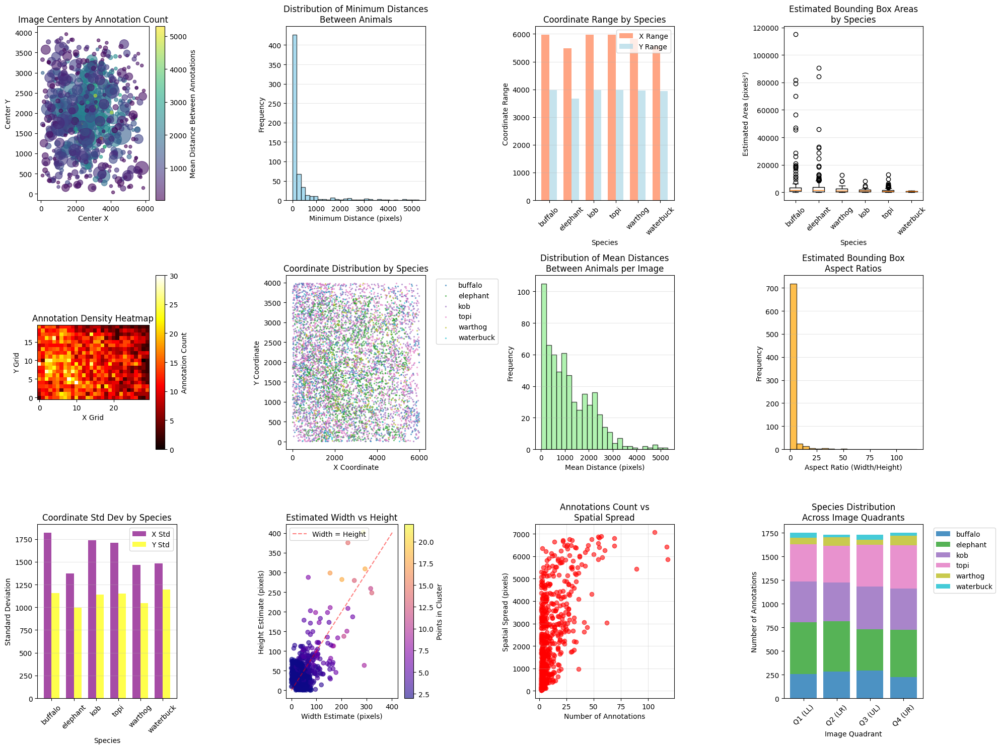


BOUNDING BOX AND SPATIAL ANALYSIS INSIGHTS:

📏 SPATIAL PATTERNS:
   • Average minimum distance between animals: 363.1 pixels
   • Average spatial spread per image: 1172.7 pixels
   • Images with tight animal clustering: 206 (33.6%)

📦 ESTIMATED BOUNDING BOX SIZES:
   • Average estimated width: 47.6 pixels
   • Average estimated height: 47.0 pixels
   • Average estimated area: 3214.7 pixels²
   • Average aspect ratio: 2.77
   • Largest estimated bounding boxes: Buffalo
   • Smallest estimated bounding boxes: Waterbuck

🎯 ANNOTATION DENSITY:
   • Grid occupancy rate: 99.8%
   • Maximum annotations per grid cell: 30
   • Average annotations per occupied cell: 11.6

💡 RECOMMENDATIONS FOR BOUNDING BOX ANNOTATION:
   • Consider using estimated sizes as initial bounding box proposals
   • Clustering analysis suggests natural groupings that could inform box sizes
   • Coordinate distributions show species-specific spatial preferences
   • Dense annotation areas may require more careful boundi

In [21]:
# Visualizations for Bounding Box and Spatial Analysis
plt.figure(figsize=(20, 15))

# 1. Spatial distribution heatmap
plt.subplot(3, 4, 1)
if len(spatial_df) > 0:
    plt.scatter(spatial_df['center_x'], spatial_df['center_y'], 
                s=spatial_df['num_annotations']*10, alpha=0.6, c=spatial_df['mean_distance'], 
                cmap='viridis')
    plt.colorbar(label='Mean Distance Between Annotations')
    plt.title('Image Centers by Annotation Count')
    plt.xlabel('Center X')
    plt.ylabel('Center Y')

# 2. Distribution of minimum distances between animals
plt.subplot(3, 4, 2)
if len(spatial_df) > 0 and 'min_distance' in spatial_df.columns:
    plt.hist(spatial_df['min_distance'], bins=30, color='skyblue', edgecolor='black', alpha=0.7)
    plt.title('Distribution of Minimum Distances\nBetween Animals')
    plt.xlabel('Minimum Distance (pixels)')
    plt.ylabel('Frequency')
    plt.grid(axis='y', alpha=0.3)

# 3. Coordinate spread by species
plt.subplot(3, 4, 3)
species_names = sorted(coord_stats_by_species.keys())
x_ranges = [coord_stats_by_species[s]['x_max'] - coord_stats_by_species[s]['x_min'] for s in species_names]
y_ranges = [coord_stats_by_species[s]['y_max'] - coord_stats_by_species[s]['y_min'] for s in species_names]

x_pos = np.arange(len(species_names))
width = 0.35

plt.bar(x_pos - width/2, x_ranges, width, label='X Range', alpha=0.7, color='coral')
plt.bar(x_pos + width/2, y_ranges, width, label='Y Range', alpha=0.7, color='lightblue')
plt.xlabel('Species')
plt.ylabel('Coordinate Range')
plt.title('Coordinate Range by Species')
plt.xticks(x_pos, species_names, rotation=45)
plt.legend()
plt.grid(axis='y', alpha=0.3)

# 4. Estimated bounding box sizes by species
plt.subplot(3, 4, 4)
if all_size_estimates:
    combined_sizes = pd.concat(all_size_estimates, ignore_index=True)
    species_order = combined_sizes.groupby('species')['area_estimate'].mean().sort_values(ascending=False).index
    
    box_data = [combined_sizes[combined_sizes['species'] == species]['area_estimate'].values 
                for species in species_order]
    
    plt.boxplot(box_data, labels=species_order)
    plt.title('Estimated Bounding Box Areas\nby Species')
    plt.xlabel('Species')
    plt.ylabel('Estimated Area (pixels²)')
    plt.xticks(rotation=45)
    plt.grid(axis='y', alpha=0.3)

# 5. Annotation density heatmap
plt.subplot(3, 4, 5)
if 'density_map' in density_analysis:
    density_map = density_analysis['density_map']
    plt.imshow(density_map.T, cmap='hot', interpolation='nearest', origin='lower')
    plt.colorbar(label='Annotation Count')
    plt.title('Annotation Density Heatmap')
    plt.xlabel('X Grid')
    plt.ylabel('Y Grid')

# 6. Coordinate distributions
plt.subplot(3, 4, 6)
colors = plt.cm.tab10(np.linspace(0, 1, len(train['Label_Name'].unique())))
for i, species in enumerate(sorted(train['Label_Name'].unique())):
    species_data = train[train['Label_Name'] == species]
    plt.scatter(species_data['x'], species_data['y'], 
                alpha=0.5, s=2, label=species, c=[colors[i]])

plt.title('Coordinate Distribution by Species')
plt.xlabel('X Coordinate')
plt.ylabel('Y Coordinate')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# 7. Distance between annotations histogram
plt.subplot(3, 4, 7)
if len(spatial_df) > 0 and 'mean_distance' in spatial_df.columns:
    plt.hist(spatial_df['mean_distance'], bins=25, color='lightgreen', edgecolor='black', alpha=0.7)
    plt.title('Distribution of Mean Distances\nBetween Animals per Image')
    plt.xlabel('Mean Distance (pixels)')
    plt.ylabel('Frequency')
    plt.grid(axis='y', alpha=0.3)

# 8. Aspect ratio analysis for estimated boxes
plt.subplot(3, 4, 8)
if all_size_estimates:
    combined_sizes = pd.concat(all_size_estimates, ignore_index=True)
    valid_aspects = combined_sizes[combined_sizes['aspect_ratio'] > 0]['aspect_ratio']
    if len(valid_aspects) > 0:
        plt.hist(valid_aspects, bins=20, color='orange', edgecolor='black', alpha=0.7)
        plt.title('Estimated Bounding Box\nAspect Ratios')
        plt.xlabel('Aspect Ratio (Width/Height)')
        plt.ylabel('Frequency')
        plt.grid(axis='y', alpha=0.3)

# 9. Coordinate standard deviation by species
plt.subplot(3, 4, 9)
x_stds = [coord_stats_by_species[s]['x_std'] for s in species_names]
y_stds = [coord_stats_by_species[s]['y_std'] for s in species_names]

plt.bar(x_pos - width/2, x_stds, width, label='X Std', alpha=0.7, color='purple')
plt.bar(x_pos + width/2, y_stds, width, label='Y Std', alpha=0.7, color='yellow')
plt.xlabel('Species')
plt.ylabel('Standard Deviation')
plt.title('Coordinate Std Dev by Species')
plt.xticks(x_pos, species_names, rotation=45)
plt.legend()
plt.grid(axis='y', alpha=0.3)

# 10. Size comparison: width vs height estimates
plt.subplot(3, 4, 10)
if all_size_estimates:
    combined_sizes = pd.concat(all_size_estimates, ignore_index=True)
    plt.scatter(combined_sizes['width_estimate'], combined_sizes['height_estimate'], 
                alpha=0.6, c=combined_sizes['points_in_cluster'], cmap='plasma')
    plt.colorbar(label='Points in Cluster')
    plt.title('Estimated Width vs Height')
    plt.xlabel('Width Estimate (pixels)')
    plt.ylabel('Height Estimate (pixels)')
    
    # Add diagonal line for reference
    max_val = max(combined_sizes['width_estimate'].max(), combined_sizes['height_estimate'].max())
    plt.plot([0, max_val], [0, max_val], 'r--', alpha=0.5, label='Width = Height')
    plt.legend()

# 11. Number of annotations per image vs image spatial spread
plt.subplot(3, 4, 11)
if len(spatial_df) > 0:
    spatial_spread = np.sqrt(spatial_df['coord_range_x']**2 + spatial_df['coord_range_y']**2)
    plt.scatter(spatial_df['num_annotations'], spatial_spread, alpha=0.6, color='red')
    plt.title('Annotations Count vs\nSpatial Spread')
    plt.xlabel('Number of Annotations')
    plt.ylabel('Spatial Spread (pixels)')
    plt.grid(alpha=0.3)

# 12. Species occurrence in different image regions
plt.subplot(3, 4, 12)
# Divide images into quadrants and count species occurrences
x_median = train['x'].median()
y_median = train['y'].median()

quadrant_counts = {}
for species in sorted(train['Label_Name'].unique()):
    species_data = train[train['Label_Name'] == species]
    
    q1 = len(species_data[(species_data['x'] <= x_median) & (species_data['y'] <= y_median)])
    q2 = len(species_data[(species_data['x'] > x_median) & (species_data['y'] <= y_median)])
    q3 = len(species_data[(species_data['x'] <= x_median) & (species_data['y'] > y_median)])
    q4 = len(species_data[(species_data['x'] > x_median) & (species_data['y'] > y_median)])
    
    quadrant_counts[species] = [q1, q2, q3, q4]

# Create stacked bar chart
bottom = np.zeros(4)
quadrant_labels = ['Q1 (LL)', 'Q2 (LR)', 'Q3 (UL)', 'Q4 (UR)']
colors = plt.cm.tab10(np.linspace(0, 1, len(quadrant_counts)))

for i, (species, counts) in enumerate(quadrant_counts.items()):
    plt.bar(quadrant_labels, counts, bottom=bottom, label=species, 
            color=colors[i], alpha=0.8)
    bottom += np.array(counts)

plt.title('Species Distribution\nAcross Image Quadrants')
plt.xlabel('Image Quadrant')
plt.ylabel('Number of Annotations')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

# Print summary insights
print("\n" + "="*60)
print("BOUNDING BOX AND SPATIAL ANALYSIS INSIGHTS:")
print("="*60)

if len(spatial_df) > 0:
    print(f"\n📏 SPATIAL PATTERNS:")
    print(f"   • Average minimum distance between animals: {spatial_df['min_distance'].mean():.1f} pixels")
    print(f"   • Average spatial spread per image: {spatial_df['mean_distance'].mean():.1f} pixels")
    print(f"   • Images with tight animal clustering: {len(spatial_df[spatial_df['min_distance'] < 50])} "
          f"({len(spatial_df[spatial_df['min_distance'] < 50])/len(spatial_df)*100:.1f}%)")

if all_size_estimates:
    combined_sizes = pd.concat(all_size_estimates, ignore_index=True)
    print(f"\n📦 ESTIMATED BOUNDING BOX SIZES:")
    print(f"   • Average estimated width: {combined_sizes['width_estimate'].mean():.1f} pixels")
    print(f"   • Average estimated height: {combined_sizes['height_estimate'].mean():.1f} pixels")
    print(f"   • Average estimated area: {combined_sizes['area_estimate'].mean():.1f} pixels²")
    print(f"   • Average aspect ratio: {combined_sizes['aspect_ratio'].mean():.2f}")
    
    # Find largest and smallest estimated animals
    largest_species = combined_sizes.groupby('species')['area_estimate'].mean().idxmax()
    smallest_species = combined_sizes.groupby('species')['area_estimate'].mean().idxmin()
    print(f"   • Largest estimated bounding boxes: {largest_species.title()}")
    print(f"   • Smallest estimated bounding boxes: {smallest_species.title()}")

print(f"\n🎯 ANNOTATION DENSITY:")
print(f"   • Grid occupancy rate: {density_analysis['occupancy_rate']:.1f}%")
print(f"   • Maximum annotations per grid cell: {density_analysis['max_density']:.0f}")
print(f"   • Average annotations per occupied cell: {density_analysis['mean_density']:.1f}")

print(f"\n💡 RECOMMENDATIONS FOR BOUNDING BOX ANNOTATION:")
print(f"   • Consider using estimated sizes as initial bounding box proposals")
print(f"   • Clustering analysis suggests natural groupings that could inform box sizes")
print(f"   • Coordinate distributions show species-specific spatial preferences")
print(f"   • Dense annotation areas may require more careful bounding box placement")

print("\n" + "="*60)